# Решение задачи:

Импортируем библиотеки:

In [ ]:
import cv2
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import random
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Add, Concatenate, Lambda, Input, Conv2D, UpSampling2D, ZeroPadding2D, BatchNormalization, LeakyReLU
from tensorflow.keras.regularizers import l2
from tensorflow.keras.losses import binary_crossentropy, sparse_categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau
from itertools import repeat
import os
import glob
import yaml
import warnings
warnings.filterwarnings('ignore')

# Отключаем JIT-компиляцию, чтобы избежать ошибки с NMS на GPU
tf.config.optimizer.set_jit(False)

Функция `DBL` на вход принимает следующие аргументы:
* `x` - тензор входных данных;
* `filter` - количество фильтров на слой, целое число;
* `kernel` - размер ядра свертки, целое число;
* `stride` - шаг свертки, целое число;
* `batch_norm` - включать ли ветку со слоем **BatchNormalization** и функцией активации **LeakyReLu**.

Обратите внимание на первое условие в функции DBL. Если шаг свертки `stride = 1`, то устанавливается `padding = 'same'` и с ним создается сверточный слой. Если шаг свертки `stride = 2`, то перед созданием сверточного слоя во входной тензор, при помощи слоя `ZeroPadding2D`, добавляется отступ из нулей, что бы ядро светки лучше захватило верхний левый угол тензора.

Второе условие в функции зависит от переменной `batch_norm`. Если условие `True`, то выполняет `BatchNormalization` и применяется активационная функция `LeakyReLu`. Данный подход используется для стабилизации обучения, ускорения сходимости и регуляризации модели в слоях.

Когда явно указываем `batch_norm=False` (по умолчанию `True`), то используется линейная функция активации `Linear` без нормализации.


In [ ]:
def DBL(x, filters, kernel, strides=1, batch_norm=True):
    if strides == 1:
        padding = 'same'
    else:
        x = ZeroPadding2D(((1, 0), (1, 0)))(x)
        padding = 'valid'
    x = Conv2D(filters=filters, kernel_size=kernel,
               strides=strides, padding=padding,
               use_bias=not batch_norm,
               kernel_regularizer=l2(0.0005))(x)
    if batch_norm:
        x = BatchNormalization(epsilon=0.001)(x)
        x = LeakyReLU(alpha=0.1)(x)
    return x

Функция `Res_unit` использует функцию `DBL` с разными настройками количества фильтров и ядра свертки. Для первой `DBL` размер ядра 1, для второй - 3.

Шаг свертки `stride = 1`, установлен по умолчанию в функции `DBL` и не изменяется.

На входе функции создается прямое соединение `skip_connection` с выходом.

In [ ]:
def ResUnit(x, filters):
    skip_connection = x
    x = DBL(x, filters // 2, 1)
    x = DBL(x, filters, 3)
    x = Add()([skip_connection, x])
    return x

Функция получает на вход тензор **$x$**, который проходит через слой **Conv2D** с ядром свертки **3х3** и шагом свертки **2** (внутри блока **DBL**), и его размерность уменьшается в два раза, а затем он проходит через `n` `ResUnit` блоков:

In [ ]:
def ResN(x, filters, blocks):
    x = DBL(x, filters, kernel=3, strides=2)
    for _ in repeat(None, blocks):
        x = ResUnit(x, filters)
    return x

Каскад сверточных слоев (**DBL**) и остаточных блоков (**ResN**) позволяют максимально извлекать визуальную информацию из изображения (форма объектов, цвет, яркость, и т.д.). Поэтому сеть **Darknet** без классификационных выходных слоев называют экстрактор. **YOLOv3** использует 3 выхода из сети **Darknet-53** для извлечения признаков в трех масштабах **Route 1**, **Route 2** и **Route 3**.

Реализуем такую сеть с 3 выходами:

In [ ]:
def Darknet(name=None):
    x = inputs = Input([None, None, 3])
    x = DBL(x, 32, 3)
    x = ResN(x, 64, 1)
    x = ResN(x, 128, 2)
    x = Route_1 = ResN(x, 256, 8)
    x = Route_2 = ResN(x, 512, 8)
    Route_3 = ResN(x, 1024, 4)
    return tf.keras.Model(inputs, (Route_1, Route_2, Route_3), name=name)

Функция `YoloHead` создаёт голову **YOLOv3** для обработки признаков в **feature pyramid**, выполняя **upsampling** и конкатенацию для **multi-scale** детекции. Она принимает входные данные (один тензор или кортеж для связи с предыдущим слоем), применяет серию **DBL-блоков** **(Conv2D** + **BatchNorm** + **LeakyReLU**) и возвращает **Keras** модель. Если вход — кортеж, выполняется **upsampling** и конкатенация для интеграции признаков разных масштабов:

In [ ]:
def YoloHead(filters, name=None):
    def layer(x_in):
        if isinstance(x_in, tuple):
            inputs = Input(x_in[0].shape[1:]), Input(x_in[1].shape[1:])
            x, x_skip = inputs
            x = DBL(x, filters, 1)
            x = UpSampling2D(2)(x)
            x = Concatenate()([x, x_skip])
        else:
            x = inputs = Input(x_in.shape[1:])
        x = DBL(x, filters, 1)
        x = DBL(x, filters * 2, 3)
        x = DBL(x, filters, 1)
        x = DBL(x, filters * 2, 3)
        x = DBL(x, filters, 1)
        return Model(inputs, x, name=name)(x_in)
    return layer

Функция `YoloHeadOutput` создаёт финальный слой головы **YOLOv3**, формирующий предсказания для заданного числа якорей (**anchors**) и классов. Она применяет два **DBL-блока** (без **BatchNorm** на последнем) для вывода координат (**x**, **y**, **w**, **h**), уверенности (**score**) и вероятностей классов, затем использует `Lambda` для `reshape` в формат [batch, grid_h, grid_w, anchors, classes+5]. Возвращает *Keras* модель, готовая для постобработки предсказаний:

In [ ]:
def YoloHeadOutput(filters, anchors, classes, name=None):
    def layer(x_in):
        x = inputs = Input(x_in.shape[1:])
        x = DBL(x, filters * 2, 3)
        x = DBL(x, anchors * (classes + 5), 1, batch_norm=False)
        x = Lambda(lambda x: tf.reshape(x, (-1, tf.shape(x)[1], tf.shape(x)[2],
                                            anchors, classes + 5)))(x)
        return tf.keras.Model(inputs, x, name=name)(x_in)
    return layer

Стандартные якоря **YOLOv3**, нормализованные под **416x416**:

In [ ]:
yolo_anchors = np.array([(10, 13), (16, 30), (33, 23), (30, 61), (62, 45),
                         (59, 119), (116, 90), (156, 198), (373, 326)], np.float32) / 416
yolo_anchor_masks = np.array([[6, 7, 8], [3, 4, 5], [0, 1, 2]])

Функция `yolo_boxes` обрабатывает необработанные предсказания **YOLOv3**, разделяя их на координаты (**x**, **y**, **w**, **h**), уверенность и классы. Используя сигмоиды и якоря, она преобразует координаты в **bounding boxes** относительно сетки размера **SxS**, возвращая коробки, уверенности, вероятности классов и исходные предсказания:

In [ ]:
def yolo_boxes(pred, anchors, classes):
    grid_size = tf.shape(pred)[1]
    box_xy, box_wh, score, class_probs = tf.split(pred, (2, 2, 1, classes), axis=-1)
    box_xy = tf.sigmoid(box_xy)
    score = tf.sigmoid(score)
    class_probs = tf.sigmoid(class_probs)
    pred_box = tf.concat((box_xy, box_wh), axis=-1)
    grid = tf.meshgrid(tf.range(grid_size), tf.range(grid_size))
    grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)
    b_xy = (box_xy + tf.cast(grid, tf.float32)) / tf.cast(grid_size, tf.float32)
    b_wh = tf.exp(box_wh) * anchors
    box_x1y1 = b_xy - b_wh / 2
    box_x2y2 = b_xy + b_wh / 2
    bbox = tf.concat([box_x1y1, box_x2y2], axis=-1)
    return bbox, score, class_probs, pred_box

Функция `nonMaximumSuppression` выполняет **NMS** (**non-maximum suppression**) для объединения предсказаний **YOLOv3** из трёх масштабов. Она конкатенирует **bounding boxes**, уверенности и вероятности классов, вычисляет итоговые **scores** как произведение уверенности и вероятностей, затем применяет `tf.image.combined_non_max_suppression` для фильтрации перекрывающихся коробок:

In [ ]:
# Снижаем порог уверенности для отображения большего количества детекций
YOLO_IOU_THRESHOLD = 0.6
YOLO_SCORE_THRESHOLD = 0.2

def nonMaximumSuppression(outputs, anchors, masks, classes):
    boxes, conf, out_type = [], [], []
    for output in outputs:
        boxes.append(tf.reshape(output[0], (tf.shape(output[0])[0], -1, tf.shape(output[0])[-1])))
        conf.append(tf.reshape(output[1], (tf.shape(output[1])[0], -1, tf.shape(output[1])[-1])))
        out_type.append(tf.reshape(output[2], (tf.shape(output[2])[0], -1, tf.shape(output[2])[-1])))

    bbox = tf.concat(boxes, axis=1)
    confidence = tf.concat(conf, axis=1)
    class_probs = tf.concat(out_type, axis=1)
    scores = confidence * class_probs

    # Меняем порядок bbox с [x1, y1, x2, y2] на [y1, x1, y2, x2], как того требует tf.image.combined_non_max_suppression
    x1, y1, x2, y2 = tf.split(bbox, 4, axis=-1)
    bbox_corrected = tf.concat([y1, x1, y2, x2], axis=-1)

    boxes, scores, classes, valid_detections = tf.image.combined_non_max_suppression(
        boxes=tf.reshape(bbox_corrected, (tf.shape(bbox_corrected)[0], -1, 1, 4)),
        scores=tf.reshape(scores, (tf.shape(scores)[0], -1, tf.shape(scores)[-1])),
        max_output_size_per_class=100,
        max_total_size=100,
        iou_threshold=YOLO_IOU_THRESHOLD,
        score_threshold=YOLO_SCORE_THRESHOLD
    )

    return boxes, scores, classes, valid_detections

Функция `YoloV3` создаёт модель *YOLOv3*, объединяя **backbone Darknet-53** с тремя выходами и головы для **multi-scale** детекции объектов. Для обучения (`training=True`) возвращает raw предсказания (координаты, уверенности, классы), а для инференса (`training=False`) применяет декодирование (`yolo_boxes`) и **NMS** для получения финальных **bounding boxes**. Параметры `size`, `anchors`, `masks`, `classes` задают размер входа, якоря, маски и число классов:

In [ ]:
SIZE = 416
def YoloV3(size=None, channels=3, anchors=yolo_anchors,
           masks=yolo_anchor_masks, classes=80, training=False):
    x = inputs = Input([size, size, channels])
    Route_1, Route_2, Route_3 = Darknet(name='yolo_darknet')(x)
    x = YoloHead(512, name='yolo_head_1')(Route_3)
    output_0 = YoloHeadOutput(512, len(masks[0]), classes, name='yolo_output_1')(x)
    x = YoloHead(256, name='yolo_head_2')((x, Route_2))
    output_1 = YoloHeadOutput(256, len(masks[1]), classes, name='yolo_output_2')(x)
    x = YoloHead(128, name='yolo_head_3')((x, Route_1))
    output_2 = YoloHeadOutput(128, len(masks[2]), classes, name='yolo_output_3')(x)
    if training:
        return Model(inputs, (output_0, output_1, output_2), name='yolov3')
    boxes_0 = Lambda(lambda x: yolo_boxes(x, anchors[masks[0]], classes), name='yolo_boxes_0')(output_0)
    boxes_1 = Lambda(lambda x: yolo_boxes(x, anchors[masks[1]], classes), name='yolo_boxes_1')(output_1)
    boxes_2 = Lambda(lambda x: yolo_boxes(x, anchors[masks[2]], classes), name='yolo_boxes_2')(output_2)
    outputs = Lambda(lambda x: nonMaximumSuppression(x, anchors, masks, classes), name='nonMaximumSuppression')((boxes_0[:3], boxes_1[:3], boxes_2[:3]))
    return Model(inputs, outputs, name='yolov3')

Функция `intersectionOverUnion` вычисляет **IoU** (**Intersection over Union**) между двумя **bounding boxes**, представленными массивами `[xmin, ymin, xmax, ymax]`, определяя площадь пересечения с помощью `interval_overlap` и деля её на объединённую площадь. Возвращает 0, если объединённая площадь равна нулю, избегая деления на ноль:

In [ ]:
def intersectionOverUnion(box1, box2):
    intersect_x1 = tf.maximum(box1[..., 0], box2[..., 0])
    intersect_y1 = tf.maximum(box1[..., 1], box2[..., 1])
    intersect_x2 = tf.minimum(box1[..., 2], box2[..., 2])
    intersect_y2 = tf.minimum(box1[..., 3], box2[..., 3])
    intersect_w = tf.maximum(0.0, intersect_x2 - intersect_x1)
    intersect_h = tf.maximum(0.0, intersect_y2 - intersect_y1)
    intersect_area = intersect_w * intersect_h
    box1_area = (box1[..., 2] - box1[..., 0]) * (box1[..., 3] - box1[..., 1])
    box2_area = (box2[..., 2] - box2[..., 0]) * (box2[..., 3] - box2[..., 1])
    union_area = box1_area + box2_area - intersect_area
    iou = intersect_area / (union_area + 1e-6)
    return iou

Функция `YoloLoss` реализует кастомную функцию потерь **YOLOv3**, суммируя потери по координатам (x, y), размерам (w, h), уверенности объекта и классификации для трёх масштабов детекции. Она декодирует предсказания, вычисляет **IoU** для маски игнорирования и применяет штраф за мелкие объекты, возвращая суммарную потерю. Используется для обучения модели, оптимизируя точность **bounding boxes** и классов:

In [ ]:
def YoloLoss(anchors, classes=80, ignore_thresh=0.5):
    def yolo_loss(y_true, y_pred):
        pred_box, pred_obj, pred_class, pred_xywh = yolo_boxes(y_pred, anchors, classes)
        pred_xy = pred_xywh[..., 0:2]
        pred_wh = pred_xywh[..., 2:4]
        true_box, true_obj, true_class_idx = tf.split(y_true, (4, 1, 1), axis=-1)
        true_xy = (true_box[..., 0:2] + true_box[..., 2:4]) / 2
        true_wh = true_box[..., 2:4] - true_box[..., 0:2]

        box_loss_scale = 2 - true_wh[..., 0] * true_wh[..., 1]
        grid_size = tf.shape(y_true)[1]
        grid = tf.meshgrid(tf.range(grid_size), tf.range(grid_size))
        grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)
        true_xy = true_xy * tf.cast(grid_size, tf.float32) - tf.cast(grid, tf.float32)
        true_wh = tf.math.log(true_wh / anchors)
        true_wh = tf.where(tf.math.is_inf(true_wh), tf.zeros_like(true_wh), true_wh)
        obj_mask = tf.squeeze(true_obj, -1)

        true_box_flat = tf.boolean_mask(true_box, tf.cast(obj_mask, tf.bool))
        best_iou = tf.reduce_max(intersectionOverUnion(
            tf.expand_dims(pred_box, axis=-2),
            tf.expand_dims(true_box_flat, axis=0)
        ), axis=-1)
        ignore_mask = tf.cast(best_iou < ignore_thresh, tf.float32)
        xy_loss = obj_mask * box_loss_scale * tf.reduce_sum(tf.square(true_xy - pred_xy), axis=-1)
        wh_loss = obj_mask * box_loss_scale * tf.reduce_sum(tf.square(true_wh - pred_wh), axis=-1)

        obj_loss = binary_crossentropy(true_obj, pred_obj, from_logits=False)
        obj_loss = obj_mask * obj_loss + (1 - obj_mask) * ignore_mask * obj_loss
        class_loss = obj_mask * sparse_categorical_crossentropy(true_class_idx, pred_class, from_logits=False)
        xy_loss = tf.reduce_sum(xy_loss, axis=(1, 2, 3))
        wh_loss = tf.reduce_sum(wh_loss, axis=(1, 2, 3))
        obj_loss = tf.reduce_sum(obj_loss, axis=(1, 2, 3))
        class_loss = tf.reduce_sum(class_loss, axis=(1, 2, 3))

        return xy_loss + wh_loss + obj_loss + class_loss
    return yolo_loss

Функция `transform_targets_for_output` преобразует ограничивающие рамки в целевой тензор, адаптированный для конкретной выходной сетки в модели обнаружения объектов, с учетом информации о блоках привязки, положениях сетки и достоверности определения объекта, что облегчает обучение архитектурам, подобным **YOLO**.

Функция `transform_targets` подготавливает целевые тензоры для моделей обнаружения объектов, подобных **YOLO**, путем включения меток определения истинности, блоков привязок и информации о классе. Он вычисляет индексы привязки на основе пересечений при объединении, добавляет их к меткам и генерирует целевые тензоры для нескольких выходных сеток с различными масштабами, что важно для эффективного обучения модели.

Эти функции работают вместе, чтобы подготовить метки истинности для обучения модели **YOLO** с несколькими выходными масштабами и конфигурациями привязок:

In [ ]:
@tf.function
def transform_targets_for_output(y_true, grid_size, anchor_idxs, classes):
    N = tf.shape(y_true)[0]
    y_true_out = tf.zeros((N, grid_size, grid_size, tf.shape(anchor_idxs)[0], 6))
    mask = tf.cast(y_true[..., 2] > 0, dtype=tf.bool)
    y_true_valid = tf.boolean_mask(y_true, mask)
    box_xy = (y_true_valid[..., 0:2] + y_true_valid[..., 2:4]) / 2.0
    grid_xy = tf.cast(box_xy // (1 / grid_size), tf.int32)
    best_anchor = tf.cast(y_true_valid[..., 5], tf.int32)

    anchor_idx = tf.argmax(tf.cast(tf.equal(best_anchor[:, tf.newaxis], tf.cast(anchor_idxs, tf.int32)), tf.int32), axis=-1)
    num_boxes = tf.shape(y_true)[1]
    batch_idx_tensor = tf.tile(tf.expand_dims(tf.range(N), 1), [1, num_boxes])
    batch_idx_valid = tf.boolean_mask(batch_idx_tensor, mask)
    indexes = tf.stack([
        batch_idx_valid, grid_xy[..., 1], grid_xy[..., 0], tf.cast(anchor_idx, tf.int32)
    ], axis=-1)
    updates = tf.stack([
        y_true_valid[..., 0], y_true_valid[..., 1], y_true_valid[..., 2], y_true_valid[..., 3],
        tf.ones_like(y_true_valid[..., 4]), y_true_valid[..., 4]
    ], axis=-1)
    return tf.tensor_scatter_nd_update(y_true_out, indexes, updates)

def transform_targets(y_train, anchors, anchor_masks, classes):
    outputs = []
    grid_size = 13
    y_train_batched = tf.expand_dims(y_train, 0)
    anchors = tf.cast(anchors, tf.float32)
    anchor_area = anchors[..., 0] * anchors[..., 1]
    box_wh = y_train_batched[..., 2:4] - y_train_batched[..., 0:2]
    box_wh = tf.tile(tf.expand_dims(box_wh, -2), (1, 1, tf.shape(anchors)[0], 1))
    box_area = box_wh[..., 0] * box_wh[..., 1]
    intersection = (tf.minimum(box_wh[..., 0], anchors[..., 0]) * tf.minimum(box_wh[..., 1], anchors[..., 1]))
    iou = intersection / (box_area + anchor_area - intersection)
    anchor_idx = tf.cast(tf.argmax(iou, axis=-1), tf.float32)
    anchor_idx = tf.expand_dims(anchor_idx, axis=-1)
    y_train_batched = tf.concat([y_train_batched, anchor_idx], axis=-1)
    for anchor_idxs in anchor_masks:
        output_batched = transform_targets_for_output(y_train_batched, grid_size, anchor_idxs, classes)
        outputs.append(tf.squeeze(output_batched, axis=0))
        grid_size *= 2
    return tuple(outputs)

def preprocess_image(image, size=SIZE):
    image = tf.image.resize(image, (size, size))
    image = image / 255.0
    return image

# Функция аугментации
@tf.function
def augment_image(image, labels):
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        labels = tf.stack([1.0 - labels[:, 2], labels[:, 1], 1.0 - labels[:, 0], labels[:, 3], labels[:, 4]], axis=-1)

    image = tf.image.random_hue(image, max_delta=0.05)
    image = tf.image.random_saturation(image, lower=0.7, upper=1.3)

    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    image = tf.clip_by_value(image, 0.0, 1.0)
    return image, labels

Загрузка датасета:

In [ ]:
!wget -q https://storage.yandexcloud.net/academy.ai/CV/chess_yolo.zip
!unzip -qo "chess_yolo.zip"

Чтение конфигурации датасета из **yaml**:

In [ ]:
yaml_path = './chess_yolo/data.yaml'
with open(yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)

Извлечение путей и классов для адаптации к датасету:

In [ ]:
base_path = './chess_yolo'
train_img_dir = os.path.join(base_path, data_config['train'])
val_img_dir = os.path.join(base_path, data_config['val'])
NUM_CLASSES = len(data_config['names'])
class_names = data_config['names']

Функция `parse_label_file` читает **.txt файл** с аннотациями в формате **YOLO** (class, cx, cy, w, h) и преобразует их в формат `[x1, y1, x2, y2, class]` (координаты углов и класс). Если файл отсутствует или пуст, возвращает dummy тензор `[1, 5]` с нулями. Используется для подготовки *ground truth* данных для обучения **YOLOv3**:

In [ ]:
def parse_label_file(label_path):
    label_content = tf.io.read_file(label_path)
    lines = tf.strings.split(label_content, '\n')
    labels = tf.TensorArray(tf.float32, size=0, dynamic_size=True)
    idx = 0
    for i in tf.range(tf.shape(lines)[0]):
        line = lines[i]
        if tf.strings.length(line) == 0: continue
        parts = tf.strings.split(line, ' ')

        # Проверяем на 9 значений
        if tf.equal(tf.shape(parts)[0], 9):
            # Этот формат содержит 9 значений: класс и 4 пары координат (x, y)
            cls = tf.strings.to_number(parts[0], out_type=tf.float32)

            # Собираем все координаты
            x1 = tf.strings.to_number(parts[1], out_type=tf.float32)
            y1 = tf.strings.to_number(parts[2], out_type=tf.float32)
            x2 = tf.strings.to_number(parts[3], out_type=tf.float32)
            y2 = tf.strings.to_number(parts[4], out_type=tf.float32)
            x3 = tf.strings.to_number(parts[5], out_type=tf.float32)
            y3 = tf.strings.to_number(parts[6], out_type=tf.float32)
            x4 = tf.strings.to_number(parts[7], out_type=tf.float32)
            y4 = tf.strings.to_number(parts[8], out_type=tf.float32)

            # Находим минимальные и максимальные координаты, чтобы создать стандартный bounding box
            min_x = tf.reduce_min([x1, x2, x3, x4])
            max_x = tf.reduce_max([x1, x2, x3, x4])
            min_y = tf.reduce_min([y1, y2, y3, y4])
            max_y = tf.reduce_max([y1, y2, y3, y4])

            # Записываем в стандартном формате [x1, y1, x2, y2, class]
            labels = labels.write(idx, [min_x, min_y, max_x, max_y, cls])
            idx += 1

    if tf.equal(idx, 0):
        return tf.zeros((0, 5), dtype=tf.float32)
    return labels.stack()

Функция `load_sample` загружает изображение и соответствующие ему аннотации из .**txt файла**, преобразует их в формат, подходящий для **YOLOv3**, и подготавливает данные для обучения. Она читает изображение, парсит аннотации в формат [x1, y1, x2, y2, class], нормализует изображение и преобразует **ground truth** для трёх масштабов детекции. Возвращает обработанное изображение и target’ы для модели:

In [ ]:
def load_sample(img_path, is_training=False):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)

    label_path = tf.strings.regex_replace(img_path, '[/\\\\]images[/\\\\]', os.path.sep + 'labels' + os.path.sep)
    label_path = tf.strings.regex_replace(label_path, '\\.jpg$', '.txt')
    labels = parse_label_file(label_path)

    img = preprocess_image(tf.cast(img, tf.float32))

    if is_training:
        img, labels = augment_image(img, labels)

    targets = transform_targets(
        labels,
        yolo_anchors,
        yolo_anchor_masks,
        NUM_CLASSES
    )
    return img, targets

Функция `get_dataset` создаёт `tf.data.Dataset` для загрузки изображений и их аннотаций из указанной директории, применяя `load_sample` для обработки, с поддержкой батчей и оптимизацией через `prefetch`. Возвращает датасет, готовый для эффективного обучения **YOLOv3** на **GPU**:

In [ ]:
def get_dataset(img_dir, batch_size=8, shuffle=True, is_training=False):
    all_img_paths = glob.glob(os.path.join(img_dir, '*.jpg'))
    verified_img_paths = []
    for img_path in all_img_paths:
        base_path, _ = os.path.splitext(img_path)
        label_path = base_path.replace(os.path.sep + 'images' + os.path.sep, os.path.sep + 'labels' + os.path.sep) + '.txt'
        if os.path.exists(label_path):
            verified_img_paths.append(img_path)
    print(f"Directory '{img_dir}':")
    print(f"  Найдено изображений: {len(all_img_paths)}")
    print(f"  Из них имеют соответствующие метки: {len(verified_img_paths)}")
    if not verified_img_paths:
        raise ValueError(f"Не найдено ни одного изображения с метками в директории: {img_dir}")
    dataset = tf.data.Dataset.from_tensor_slices(verified_img_paths)
    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(verified_img_paths))

    dataset = dataset.map(lambda x: load_sample(x, is_training=is_training), num_parallel_calls=tf.data.AUTOTUNE)

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

Создадим обучающую и валидационную выборки:

In [ ]:
train_dataset = get_dataset(train_img_dir, batch_size=8, is_training=True)
val_dataset = get_dataset(val_img_dir, batch_size=8, shuffle=False)

Directory './chess_yolo/train/images':
  Найдено изображений: 606
  Из них имеют соответствующие метки: 606
Directory './chess_yolo/valid/images':
  Найдено изображений: 58
  Из них имеют соответствующие метки: 58


Следующий код создаёт и компилирует модель **YOLOv3** для обучения, используя три кастомные функции потерь `YoloLoss` для разных масштабов детекции (**13x13, 26x26, 52x52**) и оптимизатор **Adam** с `learning rate 1e-4`. Он настраивает **callbacks** для мониторинга (`TensorBoard`) и сохранения лучшей модели (`ModelCheckpoint`). Затем запускается обучение модели на 80 эпохах с использованием тренировочного и валидационного датасетов:

In [ ]:
# Создаем модель для обучения
yolo_train = YoloV3(size=SIZE, classes=NUM_CLASSES, training=True)

losses = [
    YoloLoss(yolo_anchors[yolo_anchor_masks[0]], NUM_CLASSES),
    YoloLoss(yolo_anchors[yolo_anchor_masks[1]], NUM_CLASSES),
    YoloLoss(yolo_anchors[yolo_anchor_masks[2]], NUM_CLASSES)
]

# Настраиваем расписание для плавного снижения скорости обучения
initial_learning_rate = 1e-4
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=1000, # каждые 1000 шагов скорость будет уменьшаться
    decay_rate=0.96,  # на 4%
    staircase=True)

# Компилируем модель с новым оптимизатором
yolo_train.compile(optimizer=Adam(learning_rate=lr_schedule), loss=losses)

callbacks = [
    TensorBoard(log_dir='./logs'),
    ModelCheckpoint('yolov3_chess.weights.h5', save_best_only=True, save_weights_only=True, monitor='val_loss')
]

history = yolo_train.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=80,
    callbacks=callbacks
)

Epoch 1/80
76/76 ━━━━━━━━━━━━━━━━━━━━ 219s 2s/step - loss: 6056.0488 - yolo_output_1_loss: 354.1601 - yolo_output_2_loss: 709.7408 - yolo_output_3_loss: 4980.2324 - val_loss: 4819.1821 - val_yolo_output_1_loss: 236.1464 - val_yolo_output_2_loss: 776.5529 - val_yolo_output_3_loss: 3785.3633
Epoch 2/80
76/76 ━━━━━━━━━━━━━━━━━━━━ 55s 713ms/step - loss: 1392.3801 - yolo_output_1_loss: 76.7318 - yolo_output_2_loss: 154.7836 - yolo_output_3_loss: 1149.1277 - val_loss: 2530.0828 - val_yolo_output_1_loss: 132.4509 - val_yolo_output_2_loss: 128.7673 - val_yolo_output_3_loss: 2243.2139
Epoch 3/80
76/76 ━━━━━━━━━━━━━━━━━━━━ 52s 675ms/step - loss: 970.1176 - yolo_output_1_loss: 76.2330 - yolo_output_2_loss: 114.0424 - yolo_output_3_loss: 768.1013 - val_loss: 1378.4524 - val_yolo_output_1_loss: 58.5730 - val_yolo_output_2_loss: 106.7665 - val_yolo_output_3_loss: 1189.3827
Epoch 4/80
76/76 ━━━━━━━━━━━━━━━━━━━━ 59s 779ms/step - loss: 730.0084 - yolo_output_1_loss: 55.7496 - yolo_output_2_loss: 83.464

График потерь для мониторинга обучения:

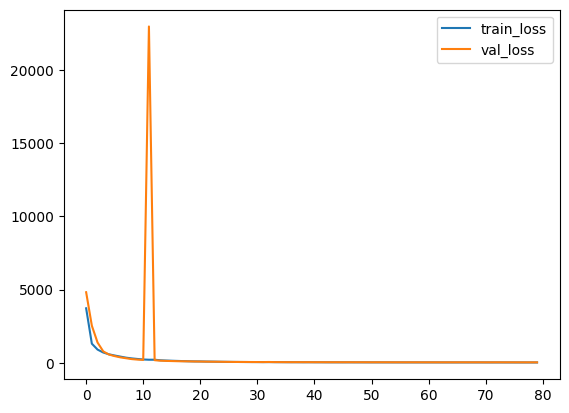

In [ ]:
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

Запуск `TensorBoard` для детального анализа:

In [ ]:
%load_ext tensorboard
%tensorboard --logdir='./logs'

<IPython.core.display.Javascript object>

Функция `draw_outputs` отрисовывает **bounding boxes** на изображении, используя предсказания модели **YOLOv3** (координаты, уверенности, классы). Она масштабирует координаты, рисует прямоугольники и добавляет метки с названиями классов и вероятностями:

In [ ]:
def draw_outputs(img, outputs, class_names):
    boxes, score, classes, nums = outputs
    boxes, score, classes, nums = boxes[0], score[0], classes[0], nums[0]

    # Конвертируем изображение из формата OpenCV (BGR) в Pillow (RGB)
    img_pil = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    draw = ImageDraw.Draw(img_pil)

    # Загружаем шрифт, который поддерживает кириллицу (в среде Colab он обычно доступен)
    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf", size=20)
    except IOError:
        font = ImageFont.load_default()

    height, width, _ = img.shape

    for i in range(nums):
        y1_norm, x1_norm, y2_norm, x2_norm = boxes[i]

        x1 = int(x1_norm * width)
        y1 = int(y1_norm * height)
        x2 = int(x2_norm * width)
        y2 = int(y2_norm * height)

        # Рисуем прямоугольник
        draw.rectangle([x1, y1, x2, y2], outline=(0, 0, 255), width=2)

        # Формируем подпись
        label = '{} {:.2f}'.format(class_names[int(classes[i])], score[i])

        # Рисуем текст с фоном для лучшей читаемости
        text_bbox = draw.textbbox((x1, y1), label, font=font)
        draw.rectangle(text_bbox, fill=(0, 0, 255))
        draw.text((x1, y1), label, font=font, fill=(255, 255, 255))

    # Конвертируем изображение обратно в формат OpenCV для отображения
    return cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR)

Этот код создаёт модель **YOLOv3** для инференса и загружает обученные веса из файла **yolov3_chess.weight.h5**:

In [ ]:
# Создаем новую модель с архитектурой для инференса
yolo_inference = YoloV3(size=SIZE, classes=NUM_CLASSES, training=False)

# Загружаем в нее лучшие веса, сохраненные во время обучения
# Этот метод надежнее, чем прямая передача, т.к. ModelCheckpoint сохранил лучшее состояние
yolo_inference.load_weights('yolov3_chess.weights.h5')

# Принудительно компилируем модель для инференса без JIT-ускорения
yolo_inference.compile(jit_compile=False)

Этот код выполняет инференс модели **YOLOv3** на случайном тестовом изображении из директории, визуализируя **bounding boxes** с классами и вероятностями:

Выполняется предсказание на 4 случайных изображениях...


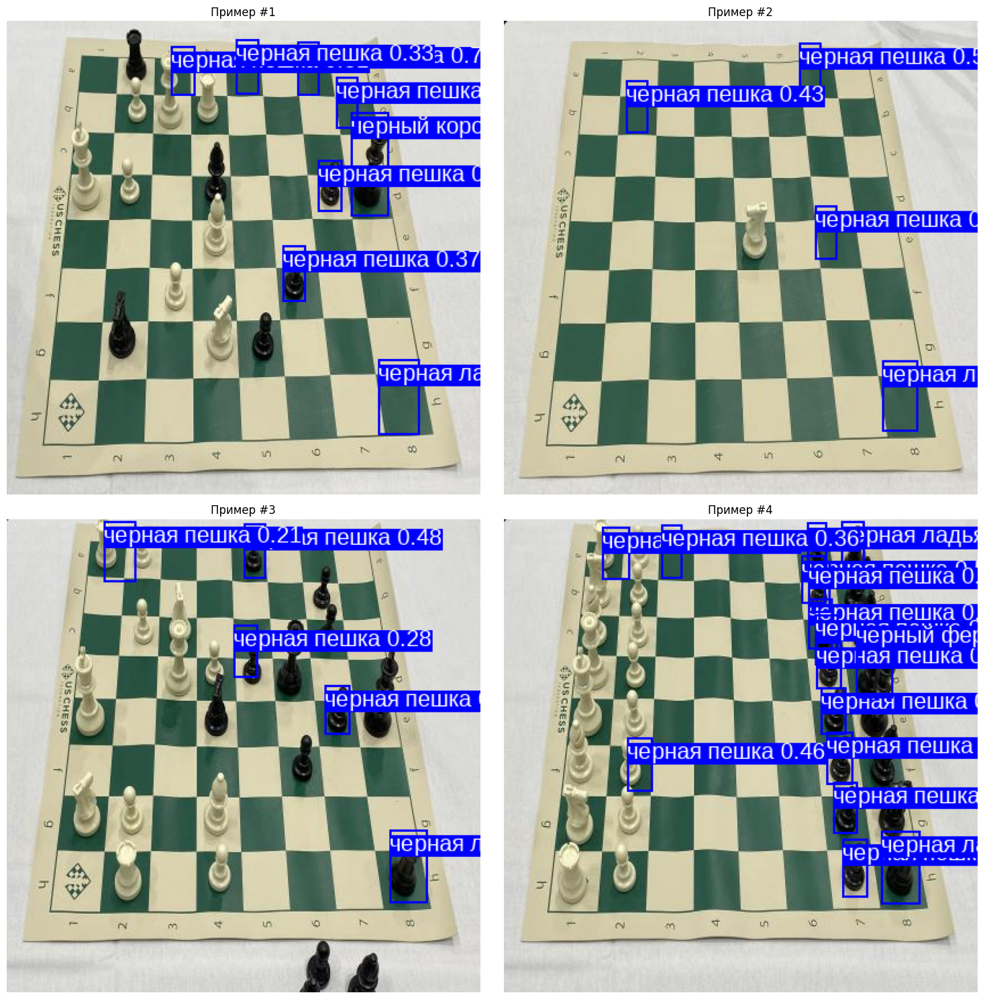

In [ ]:
# Указываем путь к тестовым изображениям
test_dir = "./chess_yolo/test/images"
test_files = glob.glob(os.path.join(test_dir, '*.jpg'))

# Устанавливаем количество примеров для предсказания
num_test_images = 4

if len(test_files) >= num_test_images:
    selected_files = random.sample(test_files, num_test_images)

    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()

    print(f"Выполняется предсказание на {num_test_images} случайных изображениях...")

    for i, img_path in enumerate(selected_files):
        test_img = cv2.imread(img_path)

        img_for_pred = tf.cast(test_img, tf.float32) / 255.0
        img_for_pred = tf.image.resize(img_for_pred, (SIZE, SIZE))
        img_for_pred = np.expand_dims(img_for_pred, 0)

        outputs = yolo_inference.predict(img_for_pred, verbose=0)

        drawn_img = draw_outputs(test_img, outputs, class_names)

        ax = axes[i]
        ax.imshow(cv2.cvtColor(drawn_img, cv2.COLOR_BGR2RGB))
        ax.set_title(f"Пример #{i+1}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print(f"Недостаточно файлов для теста. Найдено: {len(test_files)}, требуется: {num_test_images}")